Demonstration of the recent paper about CMB analysis

1. Load the library

In [1]:
import numpy as np
import healpy as hp
from matplotlib import pyplot as plt
from astropy.io import fits
import math
from astropy import units as u
from astropy.cosmology import Planck15
from mpl_toolkits.axes_grid1 import make_axes_locatable
import os
import pymaster as nmt
from system_config import ASSETS_DIRECTORY
import camb
from pathlib import Path
import requests

2. Directory name and file name

In [2]:
# CMB data
Planck_cmb_path = '/home/yunan/COM_CMB_IQU-nilc_2048_R3.00_full.fits'
Planck_cmb_map = hp.read_map(Planck_cmb_path, field=0)*1e6


# Noise data
# For Planck's observations
planck_obs_fn = "{instrument}_SkyMap_{frequency}_{obs_nside}_{rev}_full.fits"

# For Planck's Simulated Noise Maps
planck_noise_fn_template = "ffp10_noise_{frequency}_{ring_cut}_map_mc_{realization}.fits"
url_template_sims = "http://pla.esac.esa.int/pla/aio/product-action?SIMULATED_MAP.FILE_ID={fn}"

# For Half-Mission Maps
hm_map_fn_template = "{instrument}_SkyMap_{freq}_2048_R3.01_halfmission-{hm}.fits"
url_template_maps = "http://pla.esac.esa.int/pla/aio/product-action?MAP.MAP_ID={fn}"

def format_freq(freq):
    return "{:.0f}".format(freq).zfill(3)

def format_real(real):
    return "{:.0f}".format(real).zfill(5)

def get_map_data(fn, source_url_template):
    """Load map data from a file, downloading it if necessary."""
    dest_path = Path(ASSETS_DIRECTORY) / fn
    need_to_dl = False
    if not dest_path.exists():
        print(f"File {dest_path} does not exist; downloading.")
        need_to_dl = True
    elif dest_path.stat().st_size < 1024:  # If the file is less than 1KB, it's a placeholder file
        print(f"File {dest_path} has placeholder file; redownloading.")
        need_to_dl = True
    else:
        print(f"File {dest_path} exists.")
    if need_to_dl:
        response = requests.get(source_url_template.format(fn=fn))
        with open(fn, "wb") as file:
            file.write(response.content)
        print(f"Downloaded {fn}")

Noise Table from Planck

In [3]:
# All white noise levels from Planck 2018 I, Table 4
WHITE_NOISE_LEVELS = {  # in K_CMB deg (I'm not sure how to handle the degrees part)
    30: 2.5,
    44: 2.7,
    70: 3.5,
    100: 1.29,
    143: 0.55,
    217: 0.78,
    353: 2.56,
    545: 0.78,  # In kJy / sr
    857: 0.72,  # In kJy / sr
}

CENTER_FREQS = {
    30: 28.4,      # Value from Planck DeltaBandpassTable & Planck 2018 I, Table 4
    44: 44.1,      # Value from Planck DeltaBandpassTable & Planck 2018 I, Table 4
    70: 70.4,      # Value from Planck DeltaBandpassTable & Planck 2018 I, Table 4
    100: 100.89,   # Value from Planck DeltaBandpassTable
    143: 142.876,  # Value from Planck DeltaBandpassTable
    217: 221.156,  # Value from Planck DeltaBandpassTable
    353: 357.5,    # Value from Planck DeltaBandpassTable
    545: 555.2,    # Value from Planck DeltaBandpassTable
    857: 866.8,    # Value from Planck DeltaBandpassTable
}

The relationship betweem resolution of a pixel and $N_{side}$ (This is the same as Healpy nside2reso fucntion)

In [4]:
def nside2radiant(nside):
    theta_rad = np.sqrt(4*np.pi/(12*nside**2))
    return theta_rad

Nomarlization

In [5]:
def cl2dl(cl, lmin, lmax):
    l = np.arange(lmin, lmax+1)
    dl = cl * l * (l + 1) / 2 / np.pi
    return dl

def dl2cl(dl, lmin, lmax):
    l = np.arange(lmin, lmax+1)
    cl = dl * 2 * np.pi / l / (l + 1)
    return cl

Generate a theory power spectrum using CAMB

total
unlensed_scalar
unlensed_total
lensed_scalar
tensor
lens_potential


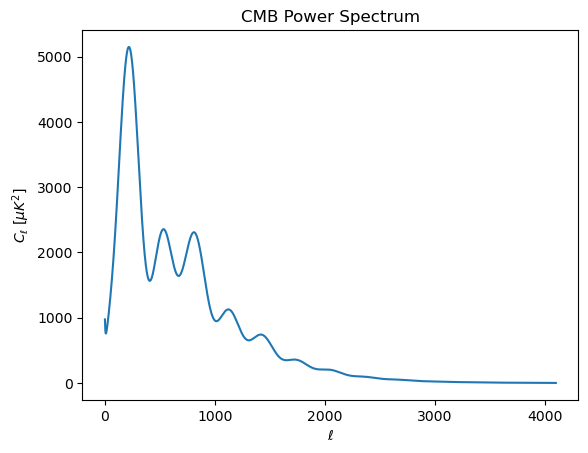

In [6]:
# Generate a CMB power spectrum
nside = 2048
ellmin = 2  # ell = 0, 1 are omitted
ellmax = 2*nside
pars = camb.CAMBparams()
pars.set_cosmology(H0=67.5, ombh2=0.022, omch2=0.122)
pars.InitPower.set_params(ns=0.965)
pars.set_for_lmax(ellmax)  # Ensure ellmax is set correctly
results = camb.get_results(pars)
powers = results.get_cmb_power_spectra(pars, CMB_unit='muK', lmax=ellmax)

for name in powers:
    print(name)

totCL = powers['total']
ell = np.arange(totCL.shape[0])
plt.plot(ell[ellmin:], totCL[ellmin:, 0])
plt.xlabel('$\ell$')
plt.ylabel('$C_\ell$ [$\mu K^2$]')
plt.title('CMB Power Spectrum')
plt.show()

Convert the theory ps to a map realisation

In [9]:
cls = np.zeros(ellmax+1)
cls = dl2cl(totCL[ellmin:, 0], ellmin, ellmax)
map_realisation = hp.synfast(cls, nside=nside, new=True)

Visulaize the map

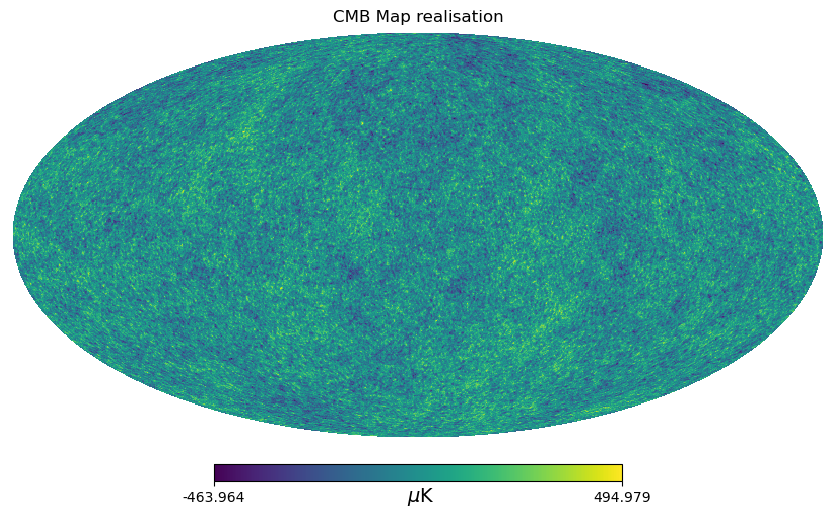

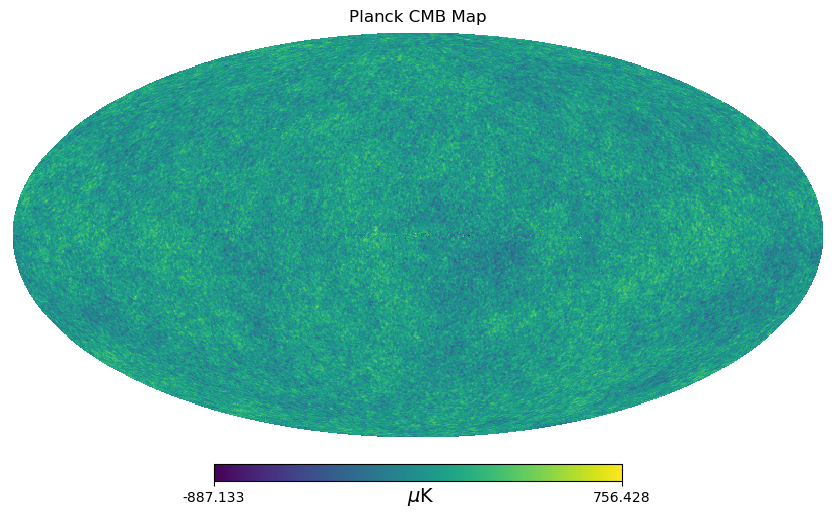

In [56]:
hp.mollview(map_realisation, title="CMB Map realisation", unit=" $\\mu$K")
hp.mollview(Planck_cmb_map, title="Planck CMB Map", unit=" $\\mu$K")

Calculate Power spectrum of the map realisation

    a. Healpy ANAFAST

    b. Pymaster Compute_full_master


In [11]:
# anafast
cls_from_map = hp.anafast(map_realisation, lmax=ellmax)
dls_from_map = np.zeros(ellmax+1)
dls_from_map = cl2dl(cls_from_map[ellmin:], ellmin, ellmax)

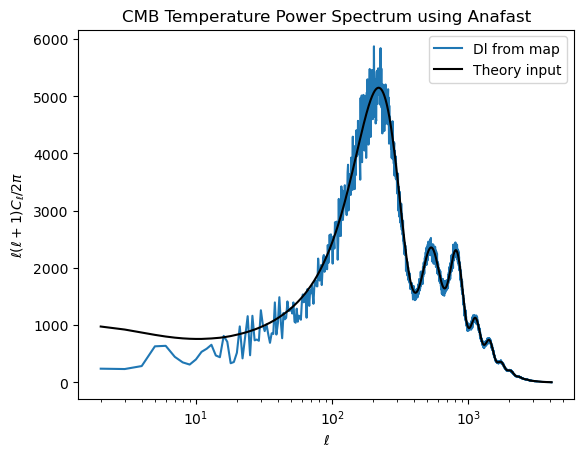

In [12]:
plt.plot(ell[ellmin:], dls_from_map, label = 'Dl from map')
plt.plot(ell[ellmin:], totCL[ellmin:, 0], c = 'black',label = 'Theory input')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$\ell (\ell + 1) C_\ell / 2\pi$')
plt.xscale('log')
plt.title("CMB Temperature Power Spectrum using Anafast")
plt.legend()
plt.show()

Apply beam smoothing

In [13]:
def arcmin2rad(arcmin):
    return arcmin * np.pi / 180 / 60

def rad2arcmin(rad):
    return rad * 180 * 60 / np.pi

In [14]:
smooth_fwhm = 5 # arcmin
fwhm = arcmin2rad(smooth_fwhm)
smooth_fwhm_new = 40 # arcmin
fwhm_new = arcmin2rad(smooth_fwhm_new)
map_realisation_smooth = hp.smoothing(map_realisation, fwhm=fwhm, lmax = ellmax)
map_realisation_smooth_new = hp.smoothing(map_realisation, fwhm=fwhm_new, lmax = ellmax)

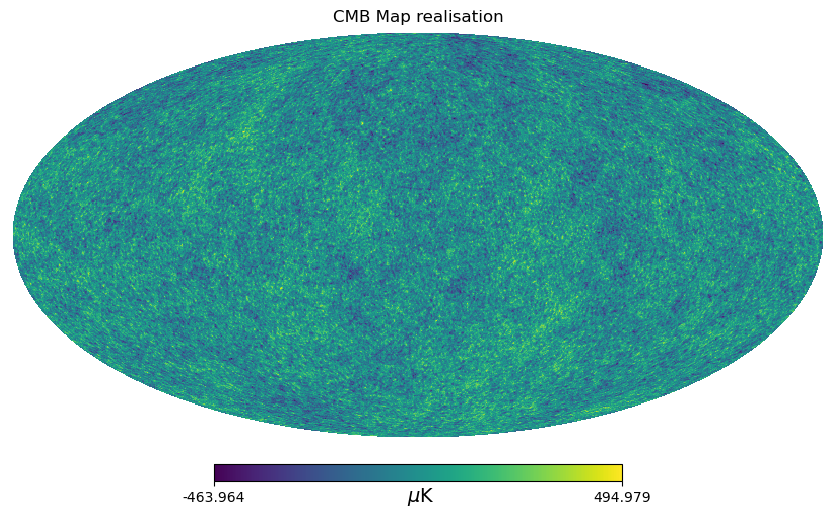

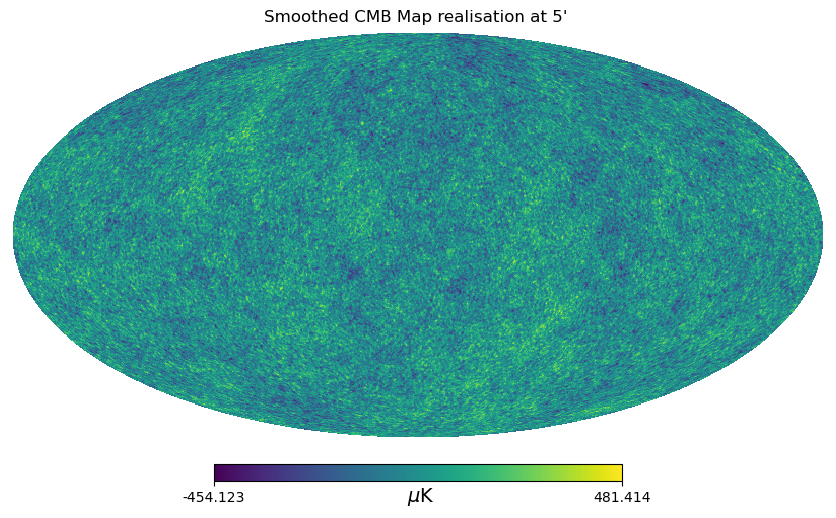

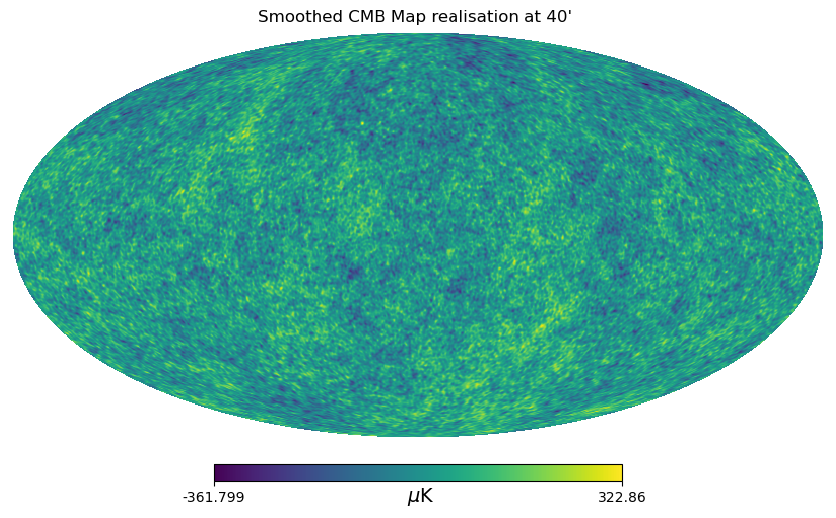

In [15]:
hp.mollview(map_realisation, title="CMB Map realisation", unit=" $\\mu$K")
hp.mollview(map_realisation_smooth, title="Smoothed CMB Map realisation at 5' ", unit=" $\\mu$K")
hp.mollview(map_realisation_smooth_new, title="Smoothed CMB Map realisation at 40' ", unit=" $\\mu$K")

Without correcting the beam

In [16]:
cl_5 = hp.anafast(map_realisation_smooth, lmax=ellmax)
cl_40 = hp.anafast(map_realisation_smooth_new, lmax=ellmax)
dl_5 = cl2dl(cl_5[ellmin:], ellmin, ellmax)
dl_40 = cl2dl(cl_40[ellmin:], ellmin, ellmax)

With beam correction

In [17]:
bl_5 = hp.gauss_beam(fwhm, lmax = ellmax)
bl_40 = hp.gauss_beam(fwhm_new, lmax = ellmax)
dl_5_corr = dl_5 /bl_5[ellmin:]**2
dl_40_corr = dl_40 /bl_40[ellmin:]**2

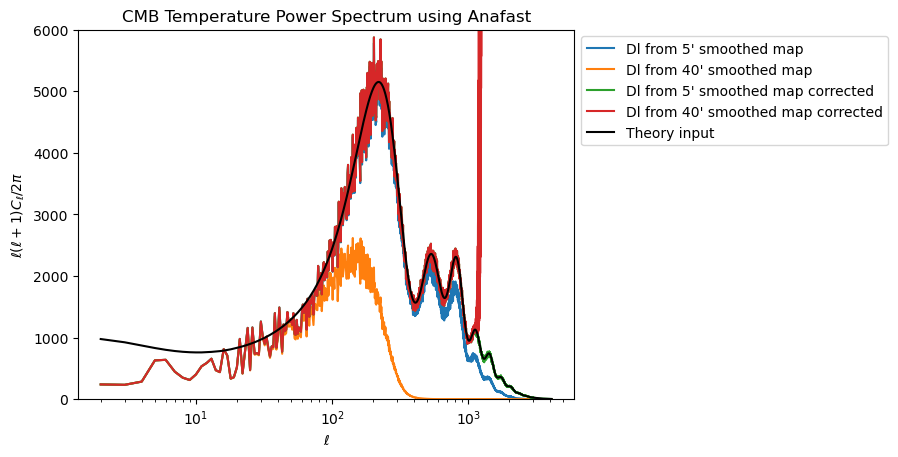

In [18]:
plt.plot(ell[ellmin:], dl_5, label = 'Dl from 5\' smoothed map')
plt.plot(ell[ellmin:], dl_40, label = 'Dl from 40\' smoothed map')
plt.plot(ell[ellmin:], dl_5_corr, label = 'Dl from 5\' smoothed map corrected')
plt.plot(ell[ellmin:], dl_40_corr, label = 'Dl from 40\' smoothed map corrected')
plt.plot(ell[ellmin:], totCL[ellmin:, 0], c = 'black',label = 'Theory input')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$\ell (\ell + 1) C_\ell / 2\pi$')
plt.xscale('log')
plt.ylim(0, 6000)
plt.title("CMB Temperature Power Spectrum using Anafast")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

Add mask to the map

In [19]:
mask = hp.read_map('/home/yunan/planck_release/planck_mask.fits')

Apodize the mask. This is processed by pymaster and can be mannually done.

In [20]:
aposcale = 0.5 # degrees
aposcale_new = 5 # degrees
mask_c1 = nmt.mask_apodization(mask, aposcale, apotype='C1')
mask_c1_new = nmt.mask_apodization(mask, aposcale_new, apotype='C1')

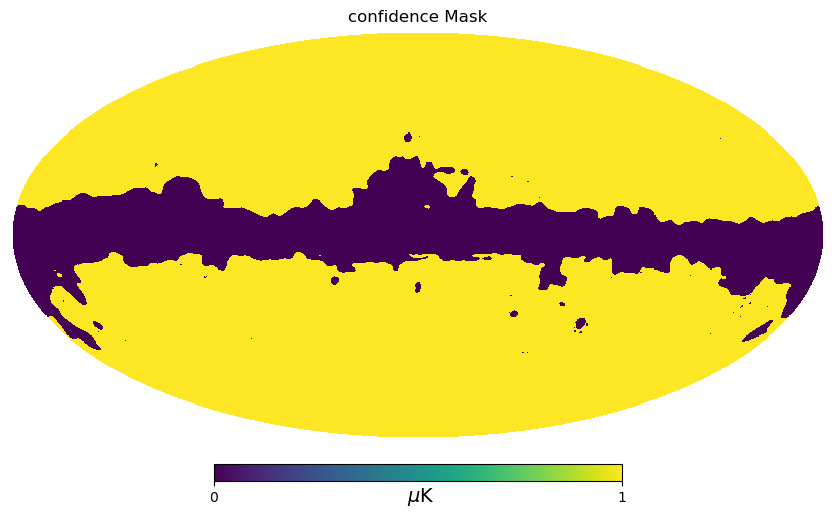

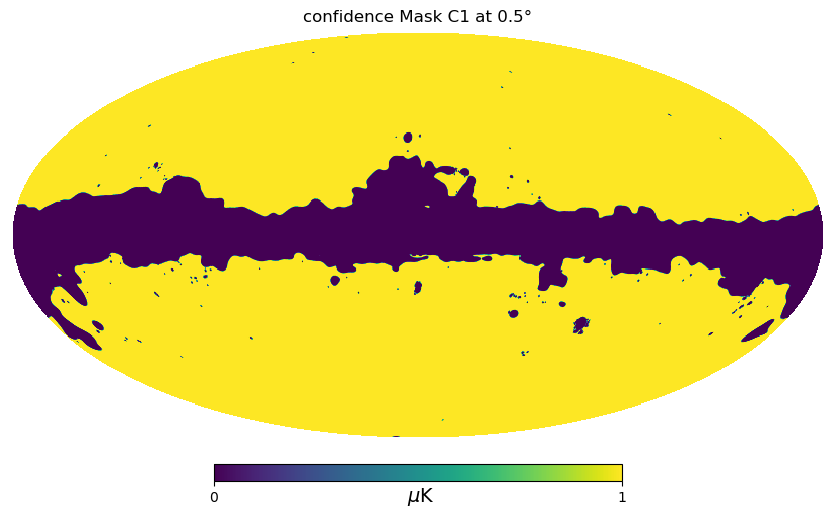

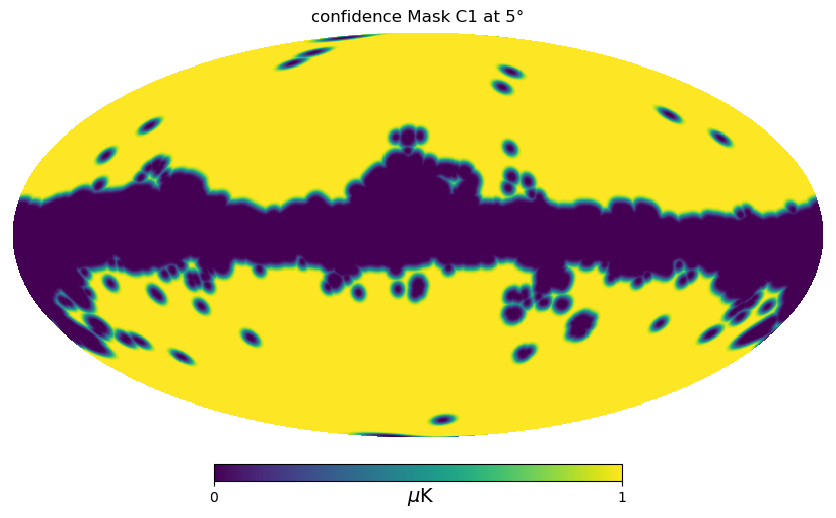

In [21]:
degree_symbol = "\u00B0"

hp.mollview(mask, title="confidence Mask", unit=" $\\mu$K")
hp.mollview(mask_c1, title=f"confidence Mask C1 at 0.5{degree_symbol}", unit=" $\\mu$K")
hp.mollview(mask_c1_new, title=f"confidence Mask C1 at 5{degree_symbol}", unit=" $\\mu$K")

In [22]:
map_masked = map_realisation * mask
map_apodized_masked = map_realisation * mask_c1
map_apodized_masked_new = map_realisation * mask_c1_new

Fraction of sky are masked out

In [23]:
fsky_mask = 1/(12*nside**2) *np.sum(mask**2)
fsky_mask_c1 = 1/(12*nside**2) *np.sum(mask_c1**2)
fsky_mask_c1_new = 1/(12*nside**2) *np.sum(mask_c1_new**2)
print(f"fsky = {fsky_mask_c1_new}")

fsky = 0.6669718888004402


In [24]:
cl_masked = hp.anafast(map_masked, lmax=ellmax)/fsky_mask
cl_apodized_masked = hp.anafast(map_apodized_masked, lmax=ellmax)/fsky_mask_c1
cl_apodized_masked_new = hp.anafast(map_apodized_masked_new, lmax=ellmax)/fsky_mask_c1_new

In [25]:
ratio = cls_from_map/ cls_from_map
ratio_1 = cl_masked / cls_from_map
ratio_2 = cl_apodized_masked / cls_from_map
ratio_3 = cl_apodized_masked_new / cls_from_map

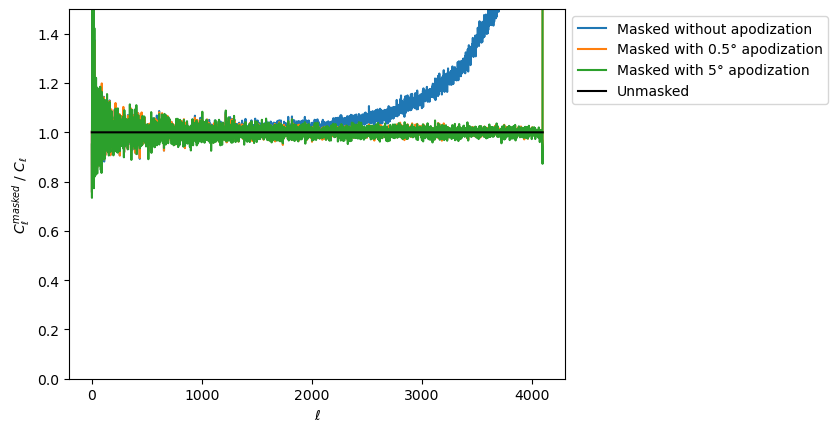

In [26]:
plt.plot(ell[ellmin:], ratio_1[ellmin:], label = 'Masked without apodization')
plt.plot(ell[ellmin:], ratio_2[ellmin:], label = f'Masked with 0.5{degree_symbol} apodization')
plt.plot(ell[ellmin:], ratio_3[ellmin:], label = f'Masked with 5{degree_symbol} apodization')
plt.plot(ell[ellmin:], ratio[ellmin:], c = 'black', label = 'Unmasked')
plt.xlabel(r'$\ell$')
plt.ylim(0, 1.5)
plt.ylabel(r'$C^{masked}_\ell$ / $C_\ell$')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

White Noise

In [27]:
def noise_level2noise_multipole(epsilon, lmax):
    epsilon_l = epsilon**2 * (np.pi/60/180)**2
    return epsilon_l * np.ones(lmax+1)

def noise_level2noise_pixel(epsilon, reso):
    epsilon_pix = epsilon/reso
    return epsilon_pix

In [28]:
kdegree2mukarcmin = 1e6*(np.pi/180/60)
detector = 100
Freq_100Ghz_noise_level = WHITE_NOISE_LEVELS[detector]*kdegree2mukarcmin

In [29]:
nl = noise_level2noise_multipole(Freq_100Ghz_noise_level, ellmax)
reso = hp.nside2resol(nside, arcmin=True)
nl_pixel = noise_level2noise_pixel(Freq_100Ghz_noise_level, reso)

In [55]:
planck_noise_path = {'30' : '/home/yunan/planck_release/ffp10_noise_030_full_map_mc_00000.fits',
                     '100': '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00000.fits',
                     '143': '/home/yunan/planck_release/ffp10_noise_143_full_map_mc_00000.fits'}
planck_noise_map = {}
frequency = ['30', '100', '143']
for frequency in planck_noise_path:
    planck_noise_map[frequency] = hp.read_map(planck_noise_path[frequency])*1e6

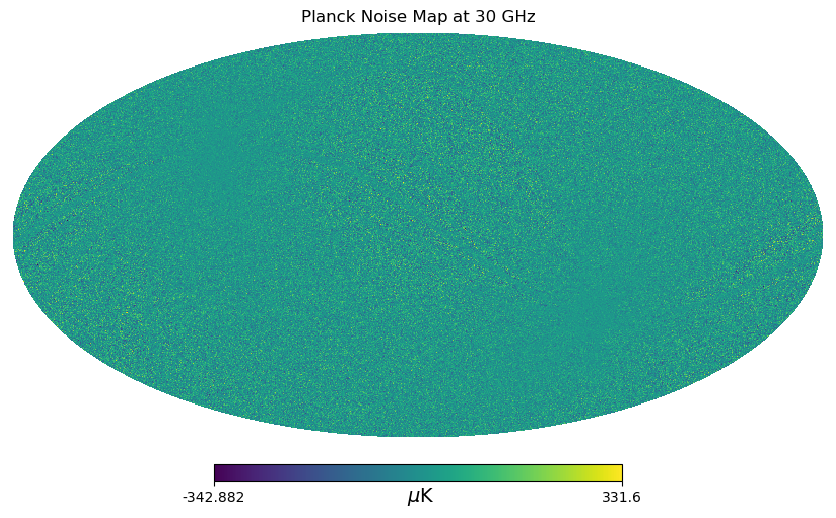

In [31]:
hp.mollview(planck_noise_map['30'], title="Planck Noise Map at 30 GHz", unit=" $\\mu$K")

In [57]:
nl_planck = {}
nl_pixel_planck = {}
for frequency in planck_noise_map:
    nl_planck[frequency] = hp.anafast(planck_noise_map[frequency], lmax=ellmax)
    nl_pixel_planck[frequency] = np.std(planck_noise_map[frequency])

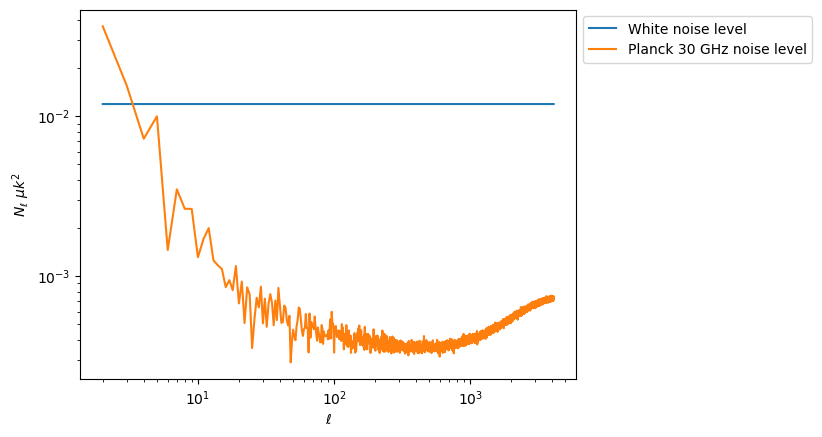

In [33]:
plt.plot(ell[ellmin:], nl[ellmin:], label = 'White noise level')
plt.plot(ell[ellmin:], nl_planck['100'][ellmin:], label = 'Planck 30 GHz noise level')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$N_\ell$ $\mu k^2$')
plt.yscale('log')
plt.xscale('log')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

In [34]:
nl_pixel_planck

{'30': 57.655594, '100': 46.027393, '143': 19.966099}

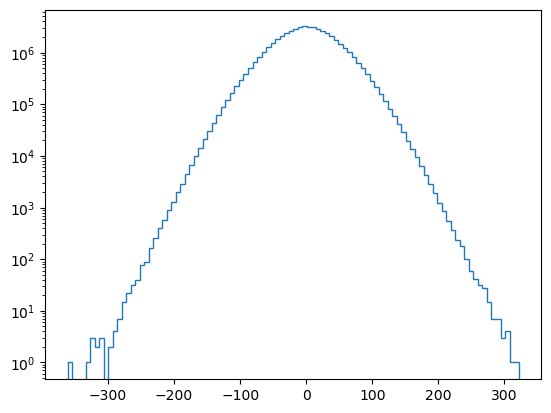

In [35]:
plt.hist(planck_noise_map['100'], bins=100, histtype='step', label='30 GHz')
plt.yscale('log')

In [36]:
three_sigma = {}
for frequency in planck_noise_map:
    three_sigma[frequency] = np.mean(planck_noise_map[frequency]) + 5*np.std(planck_noise_map[frequency])

In [37]:
three_sigma

{'30': 304.24932384490967, '100': 230.28525020182133, '143': 99.90375799685717}

Now we downgrade the noise map to $N_{side}$ = 512

In [38]:
nside_new = 512
ellmax_new = 2*nside_new
reso_new = hp.nside2resol(nside_new, arcmin=True)

We still have the same noise_level per arcminute

In [39]:
Freq_100Ghz_noise_level_new = WHITE_NOISE_LEVELS[detector]*kdegree2mukarcmin
nl_new = noise_level2noise_multipole(Freq_100Ghz_noise_level_new, ellmax_new)
nl_pixel_new = noise_level2noise_pixel(Freq_100Ghz_noise_level_new, reso_new)

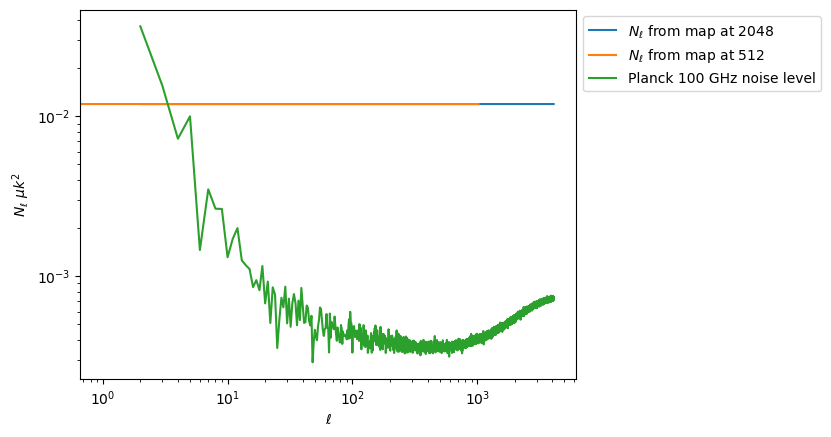

In [40]:
plt.plot(ell[ellmin:], nl[ellmin:], label = '$N_\\ell$ from map at 2048')
plt.plot(np.arange(ellmax_new+1), nl_new, label = '$N_\\ell$ from map at 512')
plt.plot(ell[ellmin:], nl_planck['100'][ellmin:], label = 'Planck 100 GHz noise level')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$N_\ell$ $\mu k^2$')
plt.yscale('log')
plt.xscale('log')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()


In [41]:
print(f"Pixel noise level at 2048: {nl_pixel}")
print(f"Pixel noise level at 512: {nl_pixel_new}")

Pixel noise level at 2048: 218.452786125428
Pixel noise level at 512: 54.613196531357


Check the map

In [42]:
wn_map_at_512 = hp.synfast(nl_new, nside=nside_new, new=True)
wn_map_at_2048 = hp.synfast(nl, nside=nside, new=True)

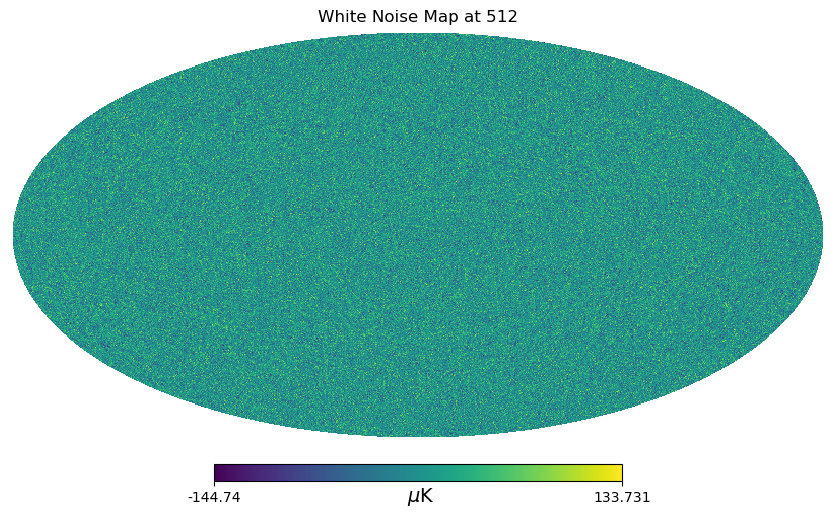

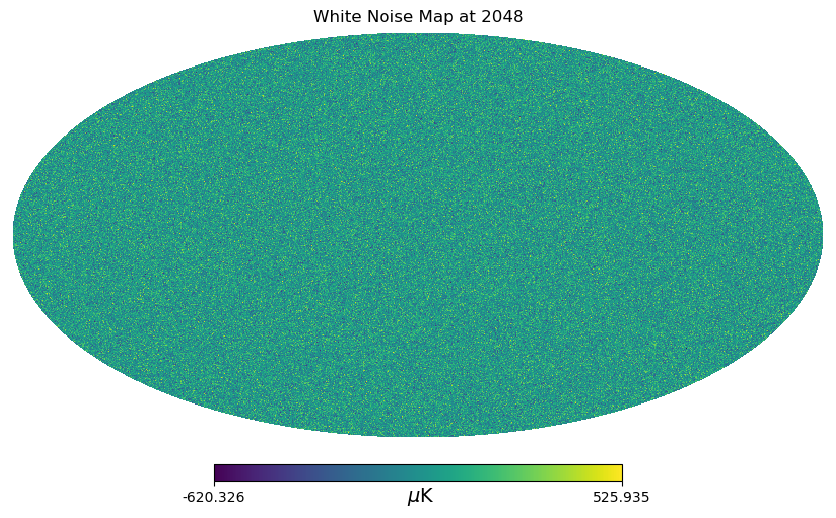

In [43]:
hp.mollview(wn_map_at_512, title="White Noise Map at 512", unit=" $\\mu$K")
hp.mollview(wn_map_at_2048, title="White Noise Map at 2048", unit=" $\\mu$K")


Try to downgrade the noise map in harmonic space

In [44]:
def get_alms(map_in):
    nside_in = hp.get_nside(map_in)
    lmax_in = 2*nside_in
    alm = hp.map2alm(map_in, lmax = lmax_in)
    return alm

def alm_udgrade(map_in, nside_out):
    alm_in = get_alms(map_in)
    lmax_out = 2*nside_out 
    alm_out = hp.almxfl(alm_in, np.ones(lmax_out + 1))
    map_out = hp.alm2map(alm_out, nside_out)
    return map_out

In [45]:
alm_from_2048 = hp.map2alm(wn_map_at_2048, lmax=ellmax)
wn_map_at_512_new = alm_udgrade(wn_map_at_2048, nside_new)

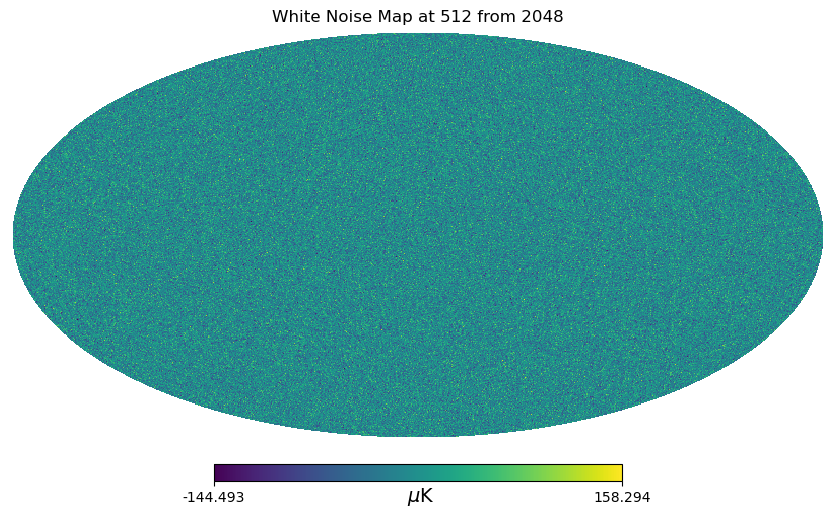

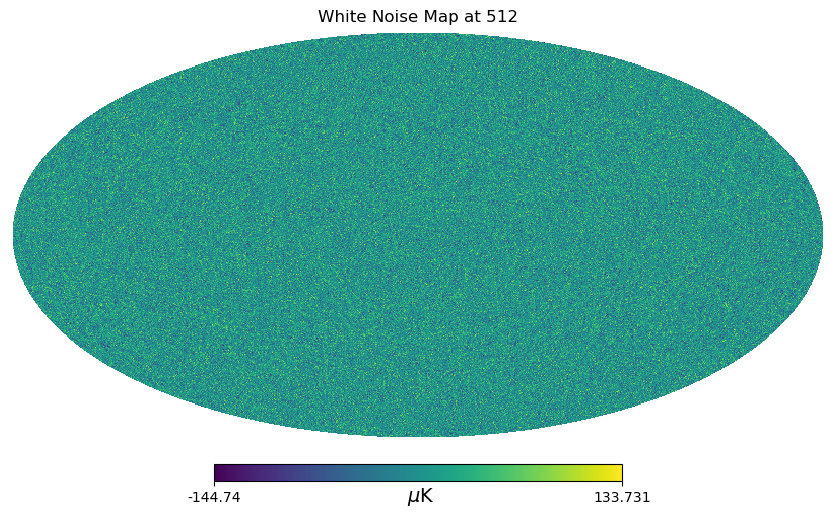

In [46]:
hp.mollview(wn_map_at_512_new, title="White Noise Map at 512 from 2048", unit=" $\\mu$K")
hp.mollview(wn_map_at_512, title="White Noise Map at 512", unit=" $\\mu$K")

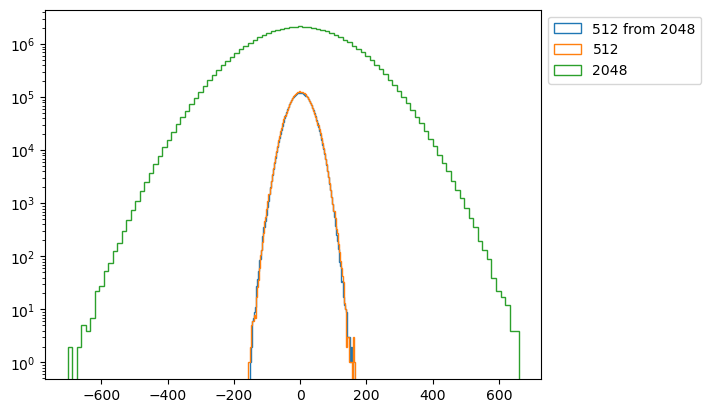

In [47]:
plt.hist(wn_map_at_512_new, bins=100, histtype='step', label='512 from 2048')
plt.hist(wn_map_at_512, bins=100, histtype='step', label='512')
plt.hist(wn_map_at_2048, bins=100, histtype='step', label='2048')
plt.yscale('log')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

In [48]:
nl_at_512_new = hp.anafast(wn_map_at_512_new, lmax=ellmax_new)

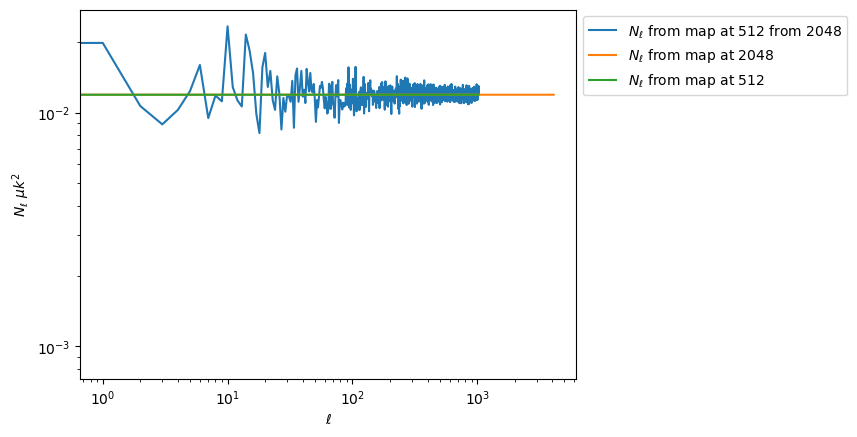

In [58]:
plt.plot(np.arange(ellmax_new+1), nl_at_512_new, label = '$N_\\ell$ from map at 512 from 2048')
plt.plot(ell, nl, label = '$N_\\ell$ from map at 2048')
plt.plot(np.arange(ellmax_new+1), nl_new, label = '$N_\\ell$ from map at 512')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$N_\ell$ $\mu k^2$')
plt.yscale('log')
plt.xscale('log')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()


If the CMB map still have some level of noise

In [50]:
residual_noise_level = 23 # muK_CMB arcmin

# For 2048
residual_noise_level_pixel = noise_level2noise_pixel(residual_noise_level, reso)
residual_noise_multipole = noise_level2noise_multipole(residual_noise_level, ellmax)

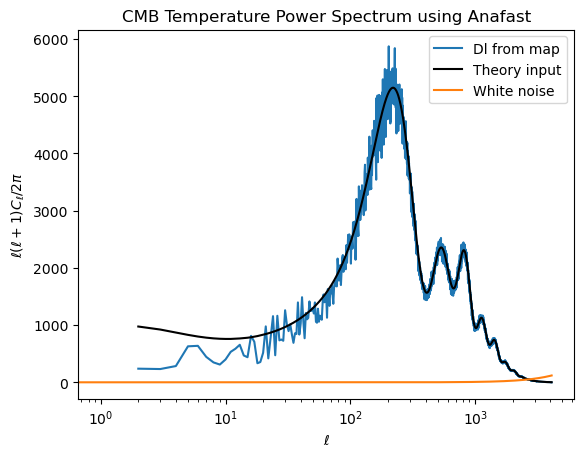

In [51]:
plt.plot(ell[ellmin:], dls_from_map, label = 'Dl from map')
plt.plot(ell[ellmin:], totCL[ellmin:, 0], c = 'black',label = 'Theory input')
plt.plot(ell, residual_noise_multipole*ell*(ell+1)/2/np.pi, label = 'White noise')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$\ell (\ell + 1) C_\ell / 2\pi$')
plt.xscale('log')
plt.title("CMB Temperature Power Spectrum using Anafast")
plt.legend()
plt.show()


# Generate White Noise using Variance map

In [7]:
#Generate a noise map with variance map
Root_dir      = '/shared/data/Assets/Planck/'
Planck_obs_fn = 'HFI_SkyMap_100_2048_R3.01_full.fits'

#Path and fn for Planck's noise maps
Planck_noise_dir = '/home/yunan/planck_release/'

# Example with 100GHz
Planck_noise_fn = {'0': 'ffp10_noise_100_full_map_mc_00000.fits',
                   '1': 'ffp10_noise_100_full_map_mc_00001.fits',
                   '2': 'ffp10_noise_100_full_map_mc_00002.fits',
                   '3': 'ffp10_noise_100_full_map_mc_00003.fits',
                   '4': 'ffp10_noise_100_full_map_mc_00004.fits',
                   '5': 'ffp10_noise_100_full_map_mc_00005.fits'}


In [8]:
#load variance map
planck_obs_path = Root_dir + Planck_obs_fn
field = 4
Planck_obs_map = hp.read_map(planck_obs_path, hdu = 1,field = field)*1e12

#load the noise maps
Planck_noise_map = {}
for i in Planck_noise_fn:
    Planck_noise_map[i] = hp.read_map(Planck_noise_dir + Planck_noise_fn[i])*1e6

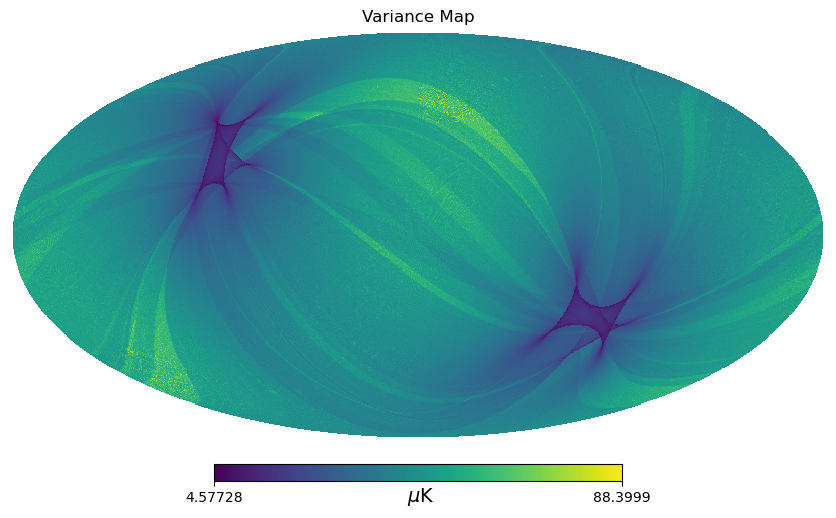

In [9]:
variance_map = np.sqrt(Planck_obs_map)
hp.mollview(variance_map, title="Variance Map", unit=" $\\mu$K")

In [10]:
rng = np.random.default_rng(1)
noise_map_simulated = rng.normal(scale = variance_map)

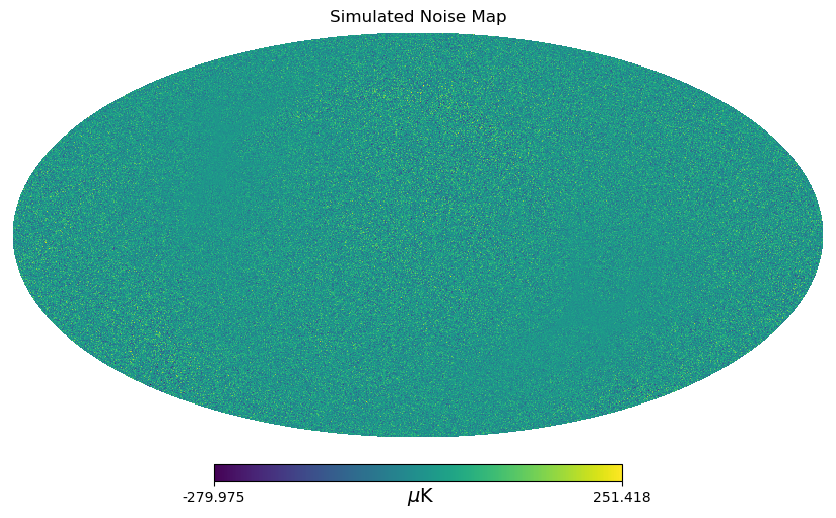

In [11]:
hp.mollview(noise_map_simulated, title="Simulated Noise Map", unit=" $\\mu$K")

In [12]:
nside = hp.get_nside(Planck_noise_map['0'])
ellmax = 2*nside

In [13]:
cl_from_sim_noise = hp.anafast(noise_map_simulated, lmax=ellmax)

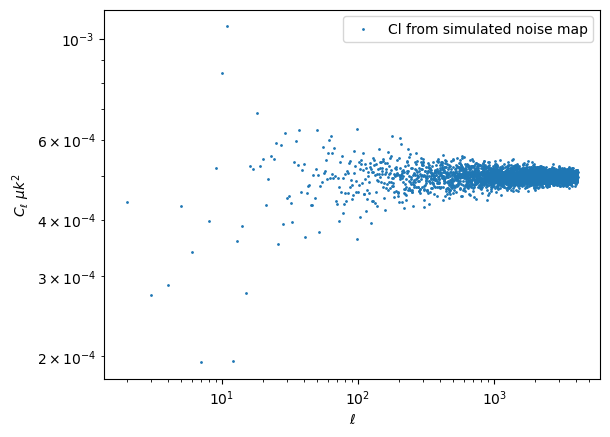

In [14]:
plt.scatter(ell[ellmin:], cl_from_sim_noise[ellmin:], s= 1,  label = 'Cl from simulated noise map')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$C_\ell$ $\mu k^2$')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.show()

In [15]:
def make_random_noise_map(sd_map, random_seed):
    """
    Make a random noise map.

    Args:
        sd_map (np.ndarray): The standard deviation map created with planck_result_to_sd_map.
        random_seed (int): The seed for the random number generator.
        center_frequency (float): The center frequency of the detector.
    """
    rng = np.random.default_rng(random_seed)
    noise_map = rng.normal(scale=sd_map)
    # noise_map = u.Quantity(noise_map, u.K_CMB, copy=False)
    return noise_map

In [16]:
noise_map_simulated = {}
seeds = np.arange(5)
for seed in seeds:
    noise_map_simulated[seed] = make_random_noise_map(variance_map, seed)

In [17]:
# Cls for cross-correlation between noise_simulated
num_maps = 5

cln_cross_corr = []

for i in range(num_maps):
    for j in range(i, num_maps):
        cln_cross_corr.append(hp.anafast(noise_map_simulated[i], noise_map_simulated[j], lmax=ellmax))


In [18]:
cln_cross_corr_array = np.array(cln_cross_corr)

In [19]:
clw_cross_corr = []

for i in range(num_maps):
    for j in range(i, num_maps):
        clw_cross_corr.append(hp.anafast(Planck_noise_map[f'{i}'], Planck_noise_map[f'{j}'], lmax=ellmax))

In [20]:
clw_cross_corr_array = np.array(clw_cross_corr)

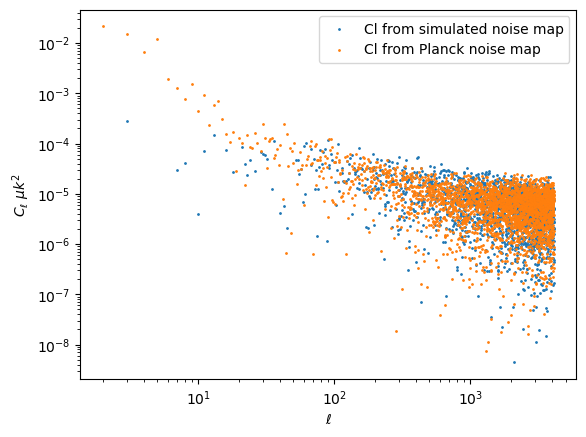

In [21]:
index = 6

plt.scatter(ell[ellmin:], cln_cross_corr_array[index][ellmin:], s = 1, label = 'Cl from simulated noise map')
plt.scatter(ell[ellmin:], clw_cross_corr[index][ellmin:], s = 1, label = 'Cl from Planck noise map')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$C_\ell$ $\mu k^2$')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.show()

In [22]:
cln_cross_corr_array_sqrt = np.sqrt(cln_cross_corr_array)
clw_cross_corr_inv_sqrt   = np.sqrt(clw_cross_corr_array)
smoothing_factor = cln_cross_corr_array_sqrt/clw_cross_corr_inv_sqrt

/tmp/ipykernel_226055/2823014133.py:1: RuntimeWarning: invalid value encountered in sqrt
  cln_cross_corr_array_sqrt = np.sqrt(cln_cross_corr_array)
/tmp/ipykernel_226055/2823014133.py:2: RuntimeWarning: invalid value encountered in sqrt
  clw_cross_corr_inv_sqrt   = np.sqrt(clw_cross_corr_array)


In [23]:
print(smoothing_factor)

[[0.03535964 0.03803056 0.12958564 ... 0.92325272 0.94731143 0.92477814]
 [0.00961586        nan        nan ...        nan        nan        nan]
 [0.0134856         nan        nan ... 1.09287356 0.87524915        nan]
 ...
 [0.0107774  0.07454397 0.20277586 ... 0.93480053 0.96069637 0.92506784]
 [       nan 0.01555888        nan ...        nan 1.01491605        nan]
 [0.02447152 0.00395984 0.14208981 ... 0.92969869 0.93012047 0.94880061]]


In [24]:
cln_cross_corr = []

cross_corr_matrices = []

for i in range(num_maps):
    row = []
    for j in range(i, num_maps):
        cln_ij = hp.anafast(noise_map_simulated[i], noise_map_simulated[j], lmax=ellmax)
        row.append(cln_ij) 
    cln_cross_corr.append(row)


num_ell = len(cln_cross_corr[0][0])  
for ell_idx in range(num_ell):
    cross_corr_matrix = np.zeros((num_maps, num_maps))  
    for i in range(num_maps):
        for j in range(i, num_maps):
            cross_corr_matrix[i, j] = cln_cross_corr[i][j-i][ell_idx]
            cross_corr_matrix[j, i] = cln_cross_corr[i][j-i][ell_idx]  


    cross_corr_matrices.append(cross_corr_matrix)

In [25]:
cross_corr_matrice_inv = np. linalg.pinv(cross_corr_matrices[0])

In [26]:
cross_corr_matrices[400]

array([[ 4.85806489e-04,  2.26872495e-05,  3.14122470e-06,
        -2.04383024e-05, -6.17097300e-06],
       [ 2.26872495e-05,  5.14241315e-04,  4.46518033e-07,
        -1.91647014e-06, -4.22085361e-05],
       [ 3.14122470e-06,  4.46518033e-07,  5.30701830e-04,
        -7.82593612e-06, -2.91074525e-05],
       [-2.04383024e-05, -1.91647014e-06, -7.82593612e-06,
         4.80656760e-04, -7.53814234e-06],
       [-6.17097300e-06, -4.22085361e-05, -2.91074525e-05,
        -7.53814234e-06,  4.90734495e-04]])

In [27]:
cross_corr_matrice_inv

array([[ 117.84611821,  109.98899002,  141.69529322,  117.12913018,
         -95.11260342],
       [ 109.98899002,  102.6557184 ,  132.24807425,  109.31980558,
         -88.77118184],
       [ 141.69529322,  132.24807425,  170.37095855,  140.83320434,
        -114.36107049],
       [ 117.12913018,  109.31980558,  140.83320434,  116.41650439,
         -94.53392846],
       [ -95.11260342,  -88.77118184, -114.36107049,  -94.53392846,
          76.76457628]])

In [28]:
clw_cross_corr = []

clw_cross_corr_matrices = []

for i in range(num_maps):
    row = []
    for j in range(i, num_maps):
        clw_ij = hp.anafast(Planck_noise_map[f'{i}'], Planck_noise_map[f'{j}'], lmax=ellmax)
        row.append(clw_ij) 
    clw_cross_corr.append(row)


num_ell = len(cln_cross_corr[0][0])  
for ell_idx in range(num_ell):
    clw_cross_corr_matrix = np.zeros((num_maps, num_maps))  
    for i in range(num_maps):
        for j in range(i, num_maps):
            clw_cross_corr_matrix[i, j] = clw_cross_corr[i][j-i][ell_idx]
            clw_cross_corr_matrix[j, i] = clw_cross_corr[i][j-i][ell_idx]  


    clw_cross_corr_matrices.append(clw_cross_corr_matrix)

In [29]:
clw_cross_corr_matrices_inv = np.linalg.pinv(clw_cross_corr_matrices[400])

In [30]:
clw_cross_corr_matrices[400]

array([[3.02602879e-04, 2.31630255e-05, 2.94639619e-05, 6.72205843e-06,
        1.91929499e-05],
       [2.31630255e-05, 2.77779559e-04, 3.45419285e-06, 9.70072483e-06,
        1.72841477e-05],
       [2.94639619e-05, 3.45419285e-06, 2.86971869e-04, 5.39472928e-06,
        7.68928212e-07],
       [6.72205843e-06, 9.70072483e-06, 5.39472928e-06, 2.93365862e-04,
        4.31757398e-06],
       [1.91929499e-05, 1.72841477e-05, 7.68928212e-07, 4.31757398e-06,
        2.77361463e-04]])

In [31]:
clw_cross_corr_matrices_inv

array([[3372.89569148, -261.54804805, -341.46421171,  -59.18960376,
        -215.23201216],
       [-261.54804805, 3638.71430224,  -14.30305406, -111.02049606,
        -206.88476011],
       [-341.46421171,  -14.30305406, 3520.91667045,  -56.67950741,
          15.64134883],
       [ -59.18960376, -111.02049606,  -56.67950741, 3415.40059747,
         -41.99481926],
       [-215.23201216, -206.88476011,   15.64134883,  -41.99481926,
        3633.79988417]])

In [32]:
inverse_matrices = []

for matrix in clw_cross_corr_matrices:
    if np.linalg.det(matrix) != 0:
        matrix_inverse = np.linalg.pinv(matrix)
        inverse_matrices.append(matrix_inverse)
    else:
        print("Warning: Matrix at this ell is singular and non-invertible.")
        inverse_matrices.append(None) 


In [33]:
inverse_matrices[400]

array([[3372.89569148, -261.54804805, -341.46421171,  -59.18960376,
        -215.23201216],
       [-261.54804805, 3638.71430224,  -14.30305406, -111.02049606,
        -206.88476011],
       [-341.46421171,  -14.30305406, 3520.91667045,  -56.67950741,
          15.64134883],
       [ -59.18960376, -111.02049606,  -56.67950741, 3415.40059747,
         -41.99481926],
       [-215.23201216, -206.88476011,   15.64134883,  -41.99481926,
        3633.79988417]])

In [34]:
scale_factor_matrix = np.zeros((len(inverse_matrices), num_maps, num_maps))
for i in range(len(inverse_matrices)):
    scale_factor_matrix[i] = np.sqrt(np.abs(cross_corr_matrices[i]*inverse_matrices[i]))

In [70]:
scale_factor_matrix[400]

array([[1.28006821, 0.0770312 , 0.03275081, 0.03478125, 0.03644435],
       [0.0770312 , 1.3679098 , 0.00252717, 0.01458655, 0.09344679],
       [0.03275081, 0.00252717, 1.36695169, 0.02106111, 0.02133729],
       [0.03478125, 0.01458655, 0.02106111, 1.2812632 , 0.01779222],
       [0.03644435, 0.09344679, 0.02133729, 0.01779222, 1.33537671]])

In [65]:
#Take the diagnal term and apply to alms from simulated noise
smoothed_noise_map_simulated = {}
for i in range(num_maps):
    alms = hp.map2alm(noise_map_simulated[i])
    alms_scaled = hp.almxfl(alms, 1/scale_factor_matrix[:, i, i])
    smoothed_noise_map_simulated[i] = hp.alm2map(alms_scaled, nside)


In [51]:
def plot_maps_side_by_side(num_maps, smoothed_noise_map_simulated, noise_map_simulated, Planck_noise_map):
    for i in range(num_maps):
        fig = plt.figure(figsize=(18, 6))  
        
        ax1 = fig.add_subplot(131)  
        hp.mollview(smoothed_noise_map_simulated[i], title=f"Scaled Noise Map {i}", unit=" $\\mu$K", sub=(1, 3, 1))
        ax1.axis('off')  
        

        ax2 = fig.add_subplot(132) 
        hp.mollview(noise_map_simulated[i], title=f"Original Noise Map {i}", unit=" $\\mu$K", sub=(1, 3, 2))
        ax2.axis('off')  
        
        ax3 = fig.add_subplot(133)  
        hp.mollview(Planck_noise_map[f'{i}'], title=f"Planck Noise Map {i}", unit=" $\\mu$K", sub=(1, 3, 3))
        ax3.axis('off')  

        plt.suptitle(f"Comparison of Noise Maps {i}", fontsize=16)
        plt.subplots_adjust(left=0.05, right=0.95, top=0.85, bottom=0.05, wspace=0.3)
        plt.show()

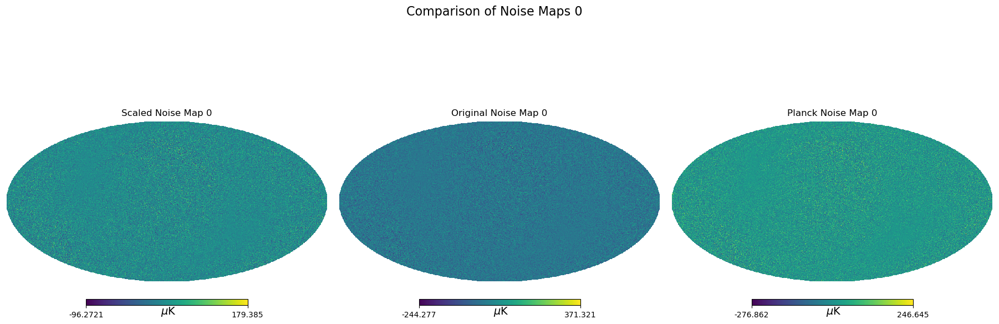

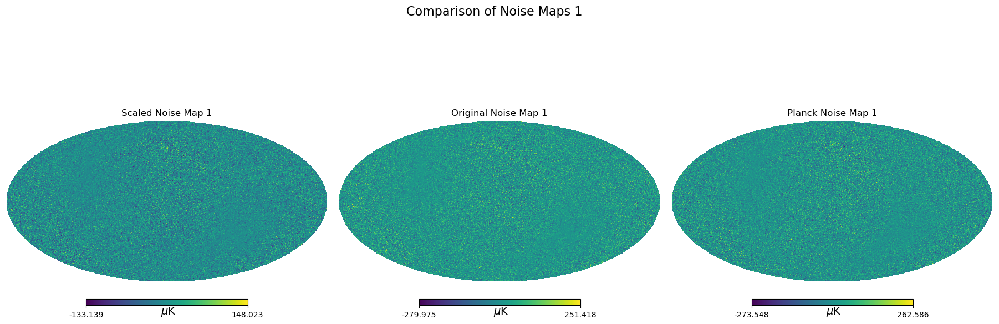

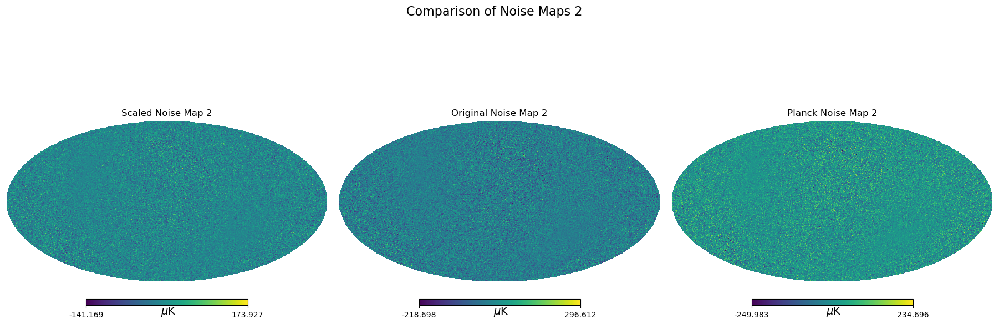

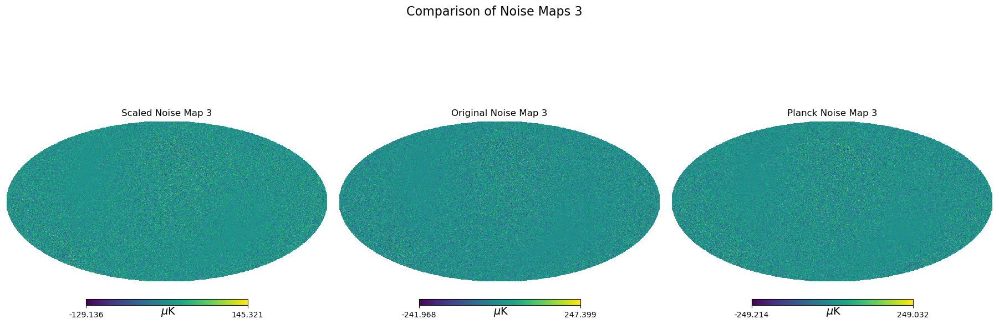

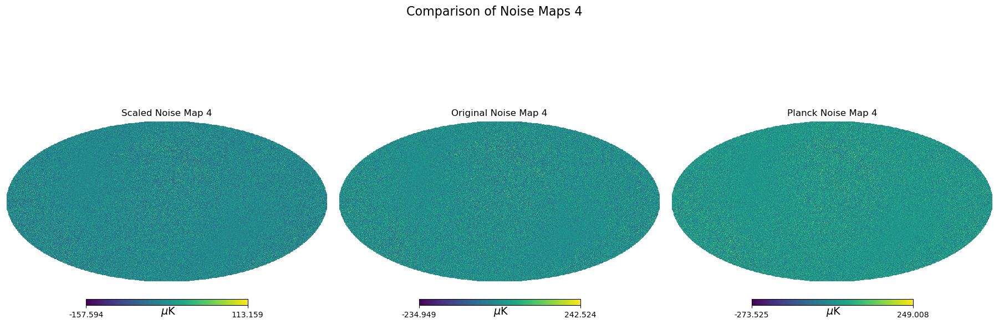

In [66]:
plot_maps_side_by_side(num_maps, smoothed_noise_map_simulated, noise_map_simulated, Planck_noise_map)

In [67]:
# Smoothed power spectrum
cls_from_wn = {}
cls_from_smoothed_wn = {}
for i in range(num_maps):
    cls_from_wn[i] = hp.anafast(noise_map_simulated[i], lmax=ellmax)
    cls_from_smoothed_wn[i] = hp.anafast(smoothed_noise_map_simulated[i], lmax=ellmax)

In [64]:
def plot_power_spectra_subplots(num_maps, ell, ellmin, cls_from_smoothed_wn, cls_from_wn, nl_planck, planck_freq='100', xlabel=r'$\ell$', ylabel=r'$C_\ell$ $\mu k^2$', log_scale=True):
    ncols = 1  
    nrows = num_maps   
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, nrows * 4))
    
    axes = axes.flatten()
    
    for i in range(num_maps):
        ax = axes[i]
        ax.plot(ell[ellmin:], cls_from_smoothed_wn[i][ellmin:], label=f'Smoothed Noise Map {i}')
        ax.plot(ell[ellmin:], cls_from_wn[i][ellmin:], label=f'Cl from simulated noise map {i}')
        ax.plot(ell[ellmin:], nl_planck[planck_freq][ellmin:], label=f'Planck {planck_freq} GHz noise level', c='black')
        
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        
        if log_scale:
            ax.set_xscale('log')
            ax.set_yscale('log')
        
        ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
    
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

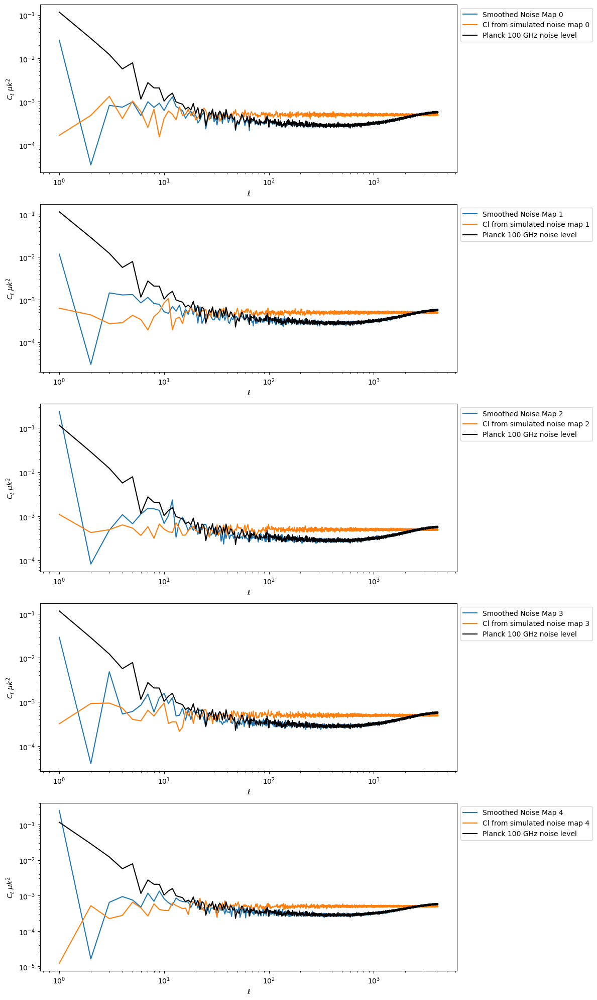

In [72]:
plot_power_spectra_subplots(num_maps, ell, 1, cls_from_smoothed_wn, cls_from_wn, nl_planck)